# In this model we use the combined dataset (cctv and general purpose images)


In [1]:
import numpy as np
import os
import cv2
from tensorflow.keras import layers, Model # type: ignore
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping # type: ignore
from tensorflow.keras.metrics import MeanSquaredError, MeanAbsoluteError # type: ignore
from tensorflow.keras.optimizers import Adam # type: ignore
import wandb
from wandb.integration.keras import WandbMetricsLogger

batch_size = 32
epochs = 50
learning_rate = 0.0001

wandb.init(
    entity="mehher_ghevandiani-american-university-of-armenia",
    project="Capstone",
    name="U-net model iteration 5",
    config={
        "learning_rate": learning_rate,
        "architecture": "U-Net",
        "dataset": "human_detection_dataset",
        "epochs": epochs,
        "batch_size": batch_size,
    },
)


print("WandB initiated")

# 59128cb3e64a55bb7c8d88cb6d50e967655db334


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: mehher_ghevandiani (mehher_ghevandiani-american-university-of-armenia) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


WandB initiated


In [2]:
def preprocess_image(img_path, img_size=(256, 256)):
    img = cv2.imread(img_path)
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB).astype(np.float32)
        img = cv2.resize(img, img_size)
        l_channel = img[:, :, 0:1] / 255.0  # Normalize L channel
        ab_channels = (img[:, :, 1:] - 128) / 128.0  # Normalize AB channels
        return l_channel, ab_channels
    else:
        print(f"Image at {img_path} could not be read.")

def preprocess_images(data_dir, img_size=(256, 256)):
    l_channels = []
    ab_channels = []

    for root, _, files in os.walk(data_dir):
        print("Processing directory:", root)
        for file in files:
            print("Processing file:", file)
            img_path = os.path.join(root, file)
            l_channel, ab_channel = preprocess_image(img_path, img_size)
            l_channels.append(l_channel)
            ab_channels.append(ab_channel)

    l_channels = np.array(l_channels, dtype=np.float32)
    ab_channels = np.array(ab_channels, dtype=np.float32)

    return l_channels, ab_channels


def lab_to_rgb(l_channel, ab_channels):
    l_channel = (l_channel * 255).astype(np.uint8)
    ab_channels = (ab_channels * 128 + 128).astype(np.uint8)
    lab_image = np.concatenate((l_channel, ab_channels), axis=-1)
    rgb_image = cv2.cvtColor(lab_image, cv2.COLOR_LAB2RGB)
    return rgb_image

def prepare_data(data_dir):
    print("Preprocessing images")
    images, labels = preprocess_images(data_dir)
    print("Data Preprocessed")
    return images, labels


def unet_model(input_shape=(256, 256, 1)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Rescaling(1./255)(inputs)  # Normalize grayscale input

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = layers.BatchNormalization()(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = layers.BatchNormalization()(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    c3 = layers.BatchNormalization()(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    c4 = layers.BatchNormalization()(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.BatchNormalization()(c5)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    c5 = layers.BatchNormalization()(c5)

    # Decoder
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.BatchNormalization()(c6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)
    c6 = layers.BatchNormalization()(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.BatchNormalization()(c7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)
    c7 = layers.BatchNormalization()(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.BatchNormalization()(c8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)
    c8 = layers.BatchNormalization()(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.BatchNormalization()(c9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)
    c9 = layers.BatchNormalization()(c9)

    # Final output: 2 channels (AB), use 'tanh' if your AB values are scaled to [-1, 1]
    outputs = layers.Conv2D(2, (1, 1), activation='tanh')(c9)

    model = Model(inputs, outputs)
    return model

def train_model(data_dir, images, labels, callbacks=None):
    model = unet_model()
    # model.compile(optimizer='adam', loss='mae', metrics=[MeanSquaredError(), MeanAbsoluteError()])

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='mae',
        metrics=[MeanSquaredError(), MeanAbsoluteError()]
    )
    print("Model Compiled")

    print("Fitting The Model")

    model.fit(
        images, labels,
        validation_split=0.2,
        batch_size=batch_size,
        epochs=epochs,
        callbacks=callbacks
    )

    model.save(f'u_net_{epochs}_epoch_iter_5.h5')


In [3]:
dataset_dir = "drive/MyDrive/combined"

images, labels = prepare_data(dataset_dir)
# would be a good idea to save this into a file


Streaming output truncated to the last 5000 lines.
Processing file: image4403.jpg
Processing file: image4420.jpg
Processing file: image4430.jpg
Processing file: image4543.jpg
Processing file: image4199.jpg
Processing file: image4378.jpg
Processing file: image4416.jpg
Processing file: image4473.jpg
Processing file: image4206.jpg
Processing file: image4355.jpg
Processing file: image4313.jpg
Processing file: image4284.jpg
Processing file: image4358.jpg
Processing file: image4258.jpg
Processing file: image4436.jpg
Processing file: image4412.jpg
Processing file: image4509.jpg
Processing file: image4425.jpg
Processing file: image4186.jpg
Processing file: image4569.jpg
Processing file: image4522.jpg
Processing file: image4281.jpg
Processing file: image4307.jpg
Processing file: image4497.jpg
Processing file: image4455.jpg
Processing file: image4456.jpg
Processing file: image4368.jpg
Processing file: image4209.jpg
Processing file: image4207.jpg
Processing file: image4496.jpg
Processing file: im

In [ ]:
# prompt: save the imges and labels arrays into a file then read it from the file

import numpy as np

# ... (Your existing code)

def prepare_data(data_dir):
    print("Preprocessing images")
    images, labels = preprocess_images(data_dir)
    print("Data Preprocessed")
    # Save the NumPy arrays to a file
    np.savez_compressed('image_labels.npz', images=images, labels=labels)
    return images, labels

dataset_dir = "drive/MyDrive/combined"

# Check if the data file exists. If it does, load it. Otherwise, prepare the data and save.
import os
if os.path.exists('image_labels.npz'):
  print("Loading data from file")
  with np.load('image_labels.npz') as data:
      images = data['images']
      labels = data['labels']
else:
  images, labels = prepare_data(dataset_dir)

# ... (rest of your code)


In [6]:
import numpy as np

np.save('images.npy', images)
np.save('labels.npy', labels)

print("Don't forget to download the files!")

In [7]:

checkpoint_callback = ModelCheckpoint(
    filepath='u_net_colorization_checkpoint.h5',
    save_best_only=True,
    monitor='val_loss',
    mode='min'
)

early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    restore_best_weights=True
)

callbacks = [checkpoint_callback,
              WandbMetricsLogger()
              ]

train_model(dataset_dir, images, labels, callbacks=callbacks)


Model Compiled
Fitting The Model
Epoch 1/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - loss: 0.2231 - mean_absolute_error: 0.2231 - mean_squared_error: 0.1194

166/166 ━━━━━━━━━━━━━━━━━━━━ 121s 379ms/step - loss: 0.2225 - mean_absolute_error: 0.2225 - mean_squared_error: 0.1189 - val_loss: 0.0977 - val_mean_absolute_error: 0.0977 - val_mean_squared_error: 0.0176
Epoch 2/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0736 - mean_absolute_error: 0.0736 - mean_squared_error: 0.0128

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 193ms/step - loss: 0.0736 - mean_absolute_error: 0.0736 - mean_squared_error: 0.0128 - val_loss: 0.0808 - val_mean_absolute_error: 0.0808 - val_mean_squared_error: 0.0140
Epoch 3/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0707 - mean_absolute_error: 0.0707 - mean_squared_error: 0.0121

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - loss: 0.0707 - mean_absolute_error: 0.0707 - mean_squared_error: 0.0121 - val_loss: 0.0761 - val_mean_absolute_error: 0.0761 - val_mean_squared_error: 0.0126
Epoch 4/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0703 - mean_absolute_error: 0.0703 - mean_squared_error: 0.0119

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0703 - mean_absolute_error: 0.0703 - mean_squared_error: 0.0119 - val_loss: 0.0741 - val_mean_absolute_error: 0.0741 - val_mean_squared_error: 0.0120
Epoch 5/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0702 - mean_absolute_error: 0.0702 - mean_squared_error: 0.0119

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0702 - mean_absolute_error: 0.0702 - mean_squared_error: 0.0119 - val_loss: 0.0707 - val_mean_absolute_error: 0.0707 - val_mean_squared_error: 0.0115
Epoch 6/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0684 - mean_absolute_error: 0.0684 - mean_squared_error: 0.0115

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - loss: 0.0684 - mean_absolute_error: 0.0684 - mean_squared_error: 0.0115 - val_loss: 0.0705 - val_mean_absolute_error: 0.0705 - val_mean_squared_error: 0.0117
Epoch 7/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 188ms/step - loss: 0.0690 - mean_absolute_error: 0.0690 - mean_squared_error: 0.0115 - val_loss: 0.0724 - val_mean_absolute_error: 0.0724 - val_mean_squared_error: 0.0127
Epoch 8/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0676 - mean_absolute_error: 0.0676 - mean_squared_error: 0.0111

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - loss: 0.0676 - mean_absolute_error: 0.0676 - mean_squared_error: 0.0111 - val_loss: 0.0703 - val_mean_absolute_error: 0.0703 - val_mean_squared_error: 0.0116
Epoch 9/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0671 - mean_absolute_error: 0.0671 - mean_squared_error: 0.0110 - val_loss: 0.0728 - val_mean_absolute_error: 0.0728 - val_mean_squared_error: 0.0132
Epoch 10/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0677 - mean_absolute_error: 0.0677 - mean_squared_error: 0.0112 - val_loss: 0.0706 - val_mean_absolute_error: 0.0706 - val_mean_squared_error: 0.0115
Epoch 11/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0670 - mean_absolute_error: 0.0670 - mean_squared_error: 0.0110 - val_loss: 0.0753 - val_mean_absolute_error: 0.0753 - val_mean_squared_error: 0.0135
Epoch 12/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0670 - mean_absolute_error: 0.0670 - mean_squared_error: 0.0110 - val_loss: 0.0780 

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0673 - mean_absolute_error: 0.0673 - mean_squared_error: 0.0111 - val_loss: 0.0692 - val_mean_absolute_error: 0.0692 - val_mean_squared_error: 0.0111
Epoch 14/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0674 - mean_absolute_error: 0.0674 - mean_squared_error: 0.0112

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0674 - mean_absolute_error: 0.0674 - mean_squared_error: 0.0112 - val_loss: 0.0688 - val_mean_absolute_error: 0.0688 - val_mean_squared_error: 0.0108
Epoch 15/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0663 - mean_absolute_error: 0.0663 - mean_squared_error: 0.0108 - val_loss: 0.0702 - val_mean_absolute_error: 0.0702 - val_mean_squared_error: 0.0121
Epoch 16/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0667 - mean_absolute_error: 0.0667 - mean_squared_error: 0.0110 - val_loss: 0.0689 - val_mean_absolute_error: 0.0689 - val_mean_squared_error: 0.0111
Epoch 17/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0667 - mean_absolute_error: 0.0667 - mean_squared_error: 0.0110 - val_loss: 0.0718 - val_mean_absolute_error: 0.0718 - val_mean_squared_error: 0.0121
Epoch 18/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0655 - mean_absolute_error: 0.0655 - mean_squared_error: 0.0106 - val_loss: 0.0725

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0647 - mean_absolute_error: 0.0647 - mean_squared_error: 0.0103 - val_loss: 0.0680 - val_mean_absolute_error: 0.0680 - val_mean_squared_error: 0.0110
Epoch 20/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0654 - mean_absolute_error: 0.0654 - mean_squared_error: 0.0105 - val_loss: 0.0736 - val_mean_absolute_error: 0.0736 - val_mean_squared_error: 0.0131
Epoch 21/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0652 - mean_absolute_error: 0.0652 - mean_squared_error: 0.0105

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - loss: 0.0652 - mean_absolute_error: 0.0652 - mean_squared_error: 0.0105 - val_loss: 0.0676 - val_mean_absolute_error: 0.0676 - val_mean_squared_error: 0.0110
Epoch 22/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0646 - mean_absolute_error: 0.0646 - mean_squared_error: 0.0103 - val_loss: 0.0689 - val_mean_absolute_error: 0.0689 - val_mean_squared_error: 0.0115
Epoch 23/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0644 - mean_absolute_error: 0.0644 - mean_squared_error: 0.0103 - val_loss: 0.0695 - val_mean_absolute_error: 0.0695 - val_mean_squared_error: 0.0122
Epoch 24/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0633 - mean_absolute_error: 0.0633 - mean_squared_error: 0.0100 - val_loss: 0.0693 - val_mean_absolute_error: 0.0693 - val_mean_squared_error: 0.0120
Epoch 25/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 31s 189ms/step - loss: 0.0630 - mean_absolute_error: 0.0630 - mean_squared_error: 0.0099 - val_loss: 0.0741

166/166 ━━━━━━━━━━━━━━━━━━━━ 32s 195ms/step - loss: 0.0393 - mean_absolute_error: 0.0393 - mean_squared_error: 0.0040 - val_loss: 0.0673 - val_mean_absolute_error: 0.0673 - val_mean_squared_error: 0.0105


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


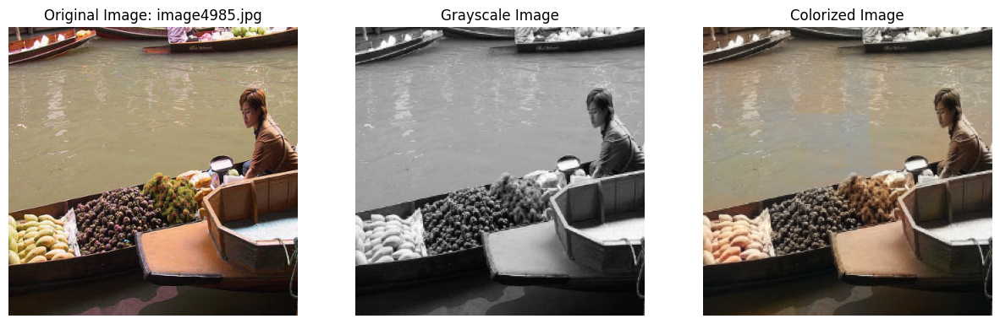

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


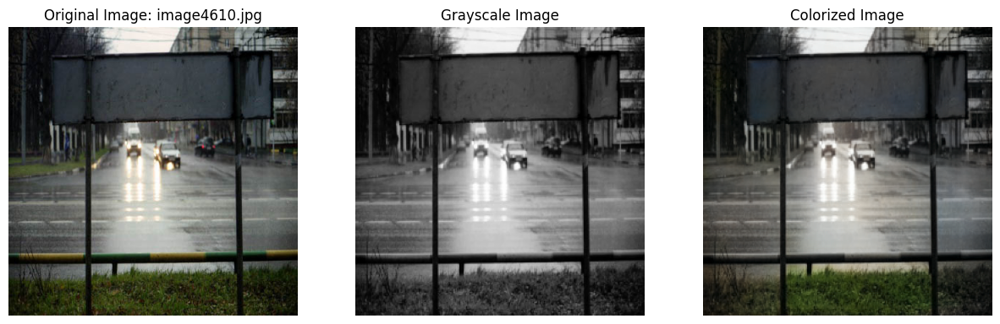

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


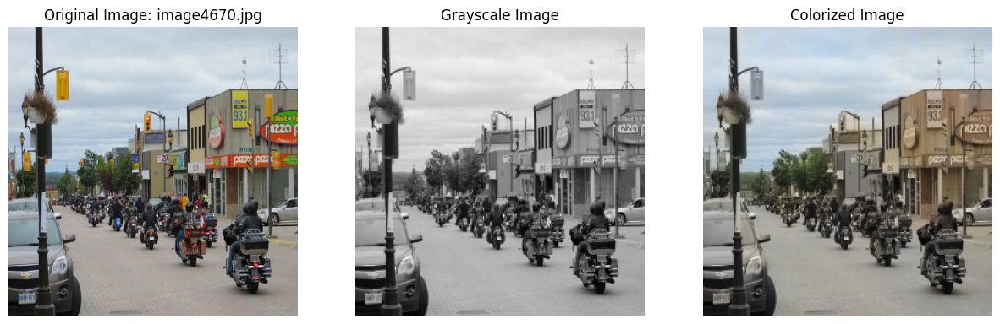

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


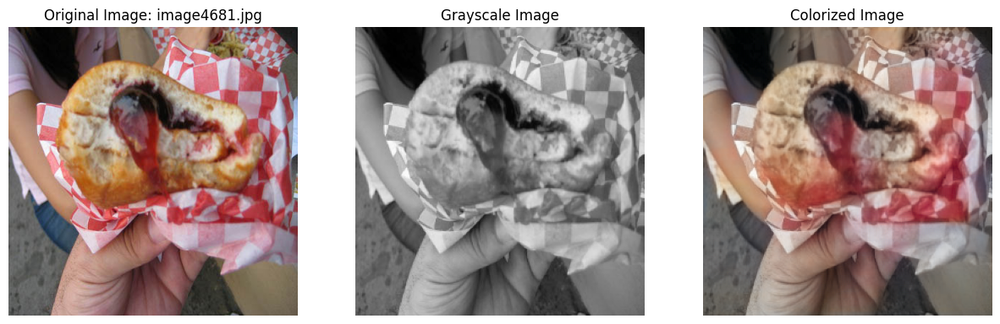

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


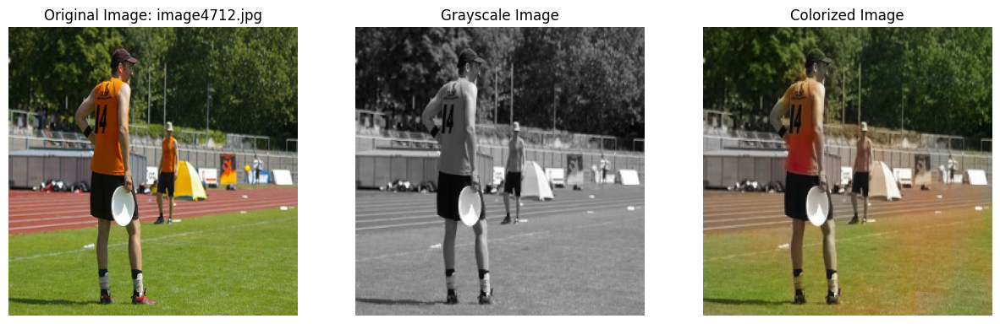

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


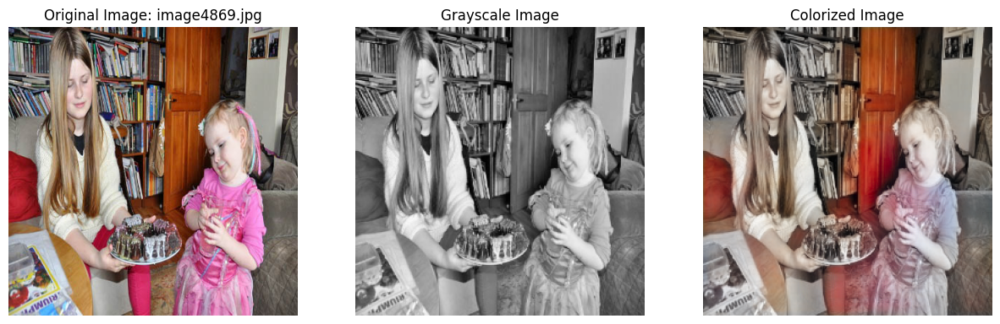

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


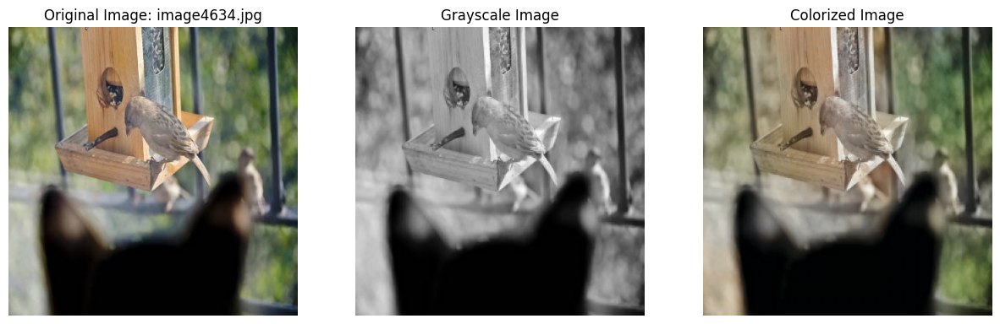

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


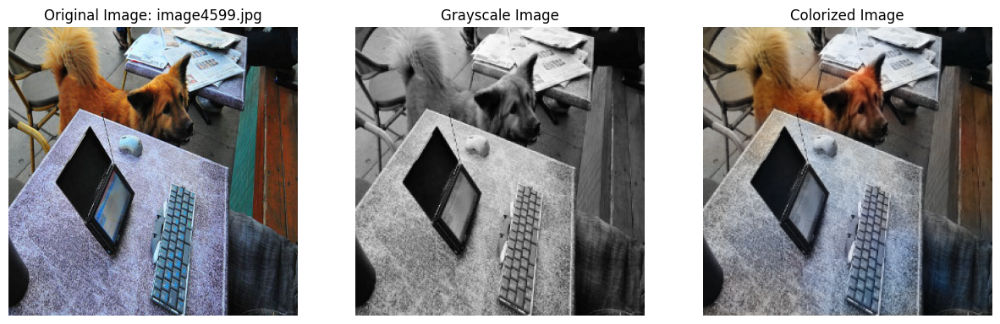

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


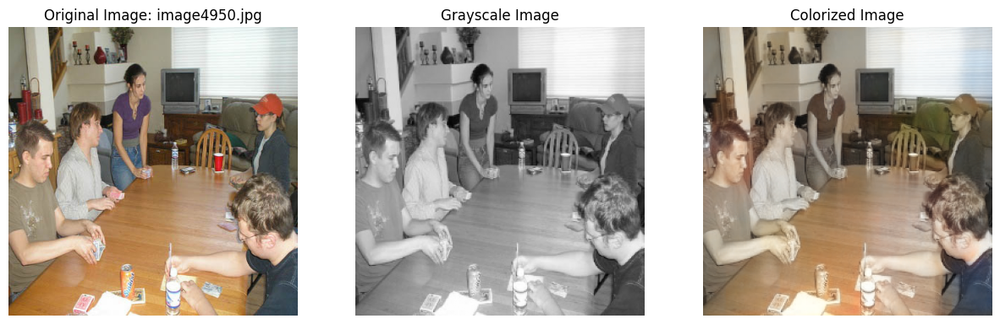

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


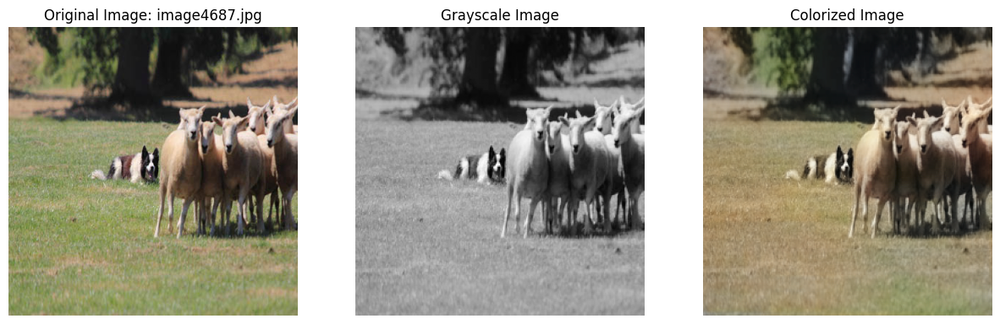

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


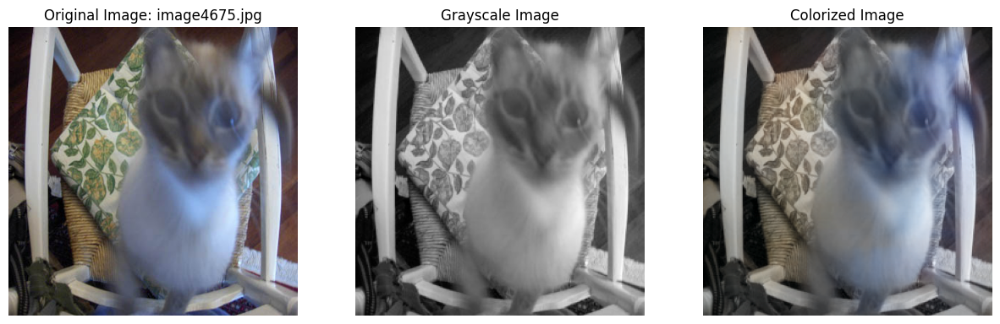

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


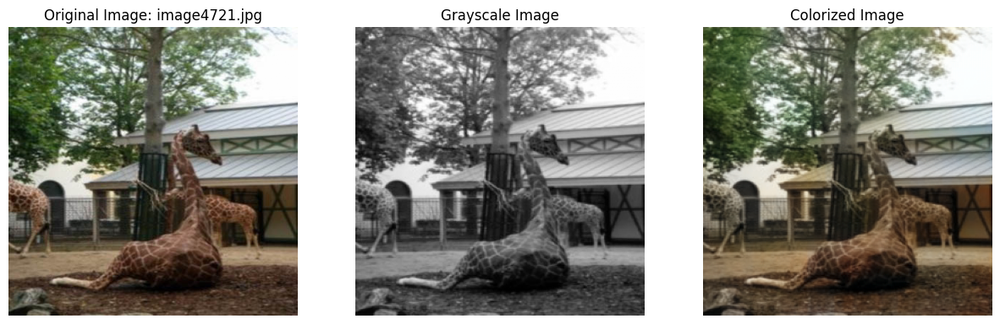

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


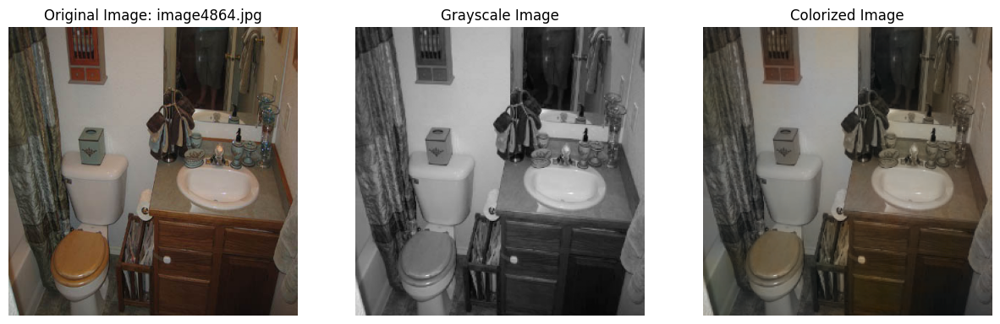

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


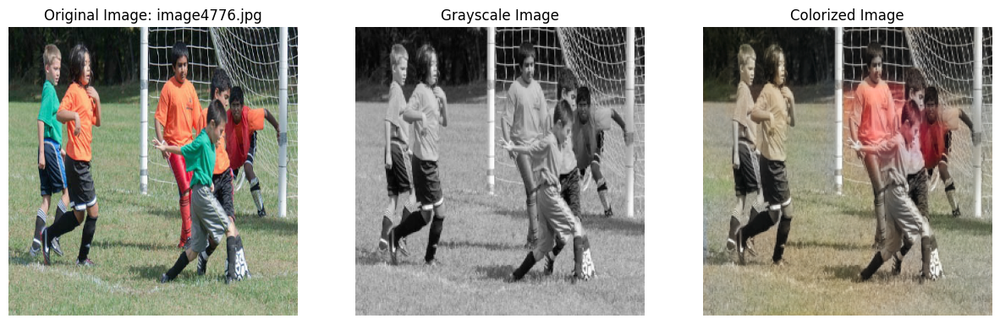

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


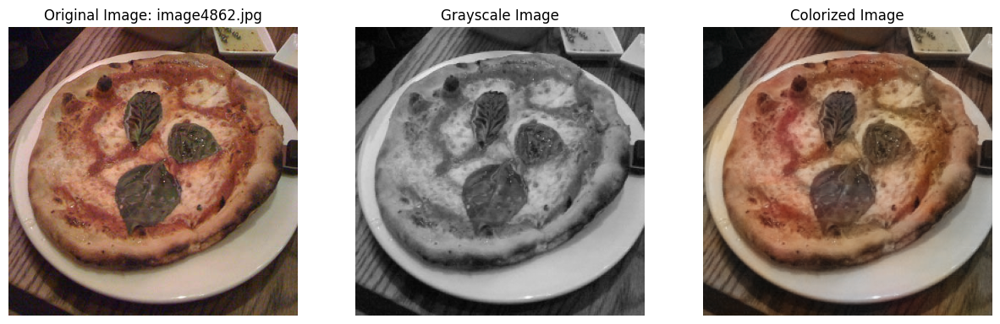

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


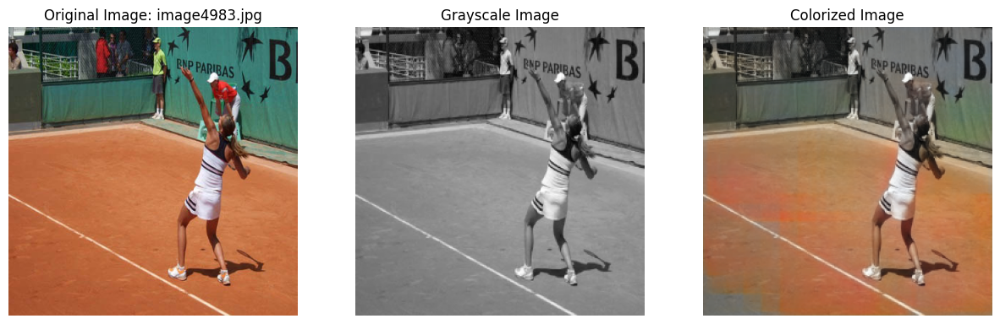

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


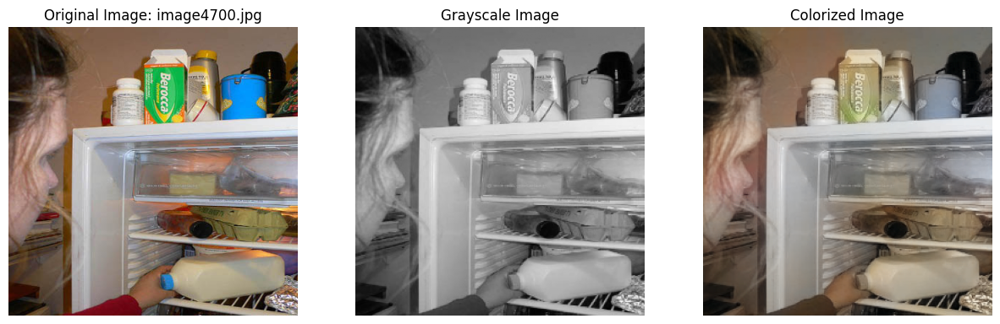

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


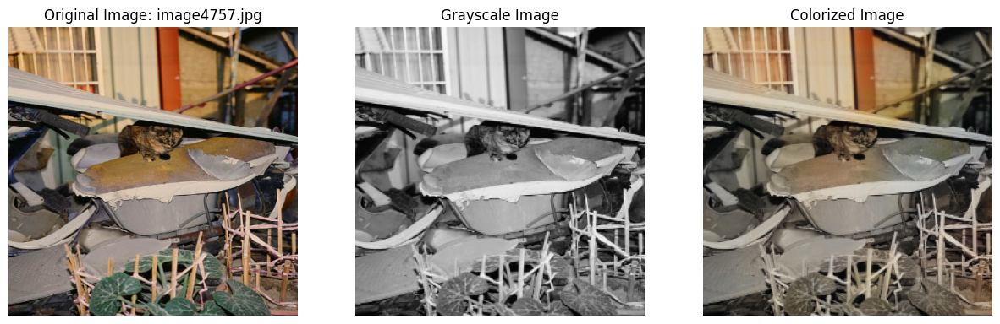

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


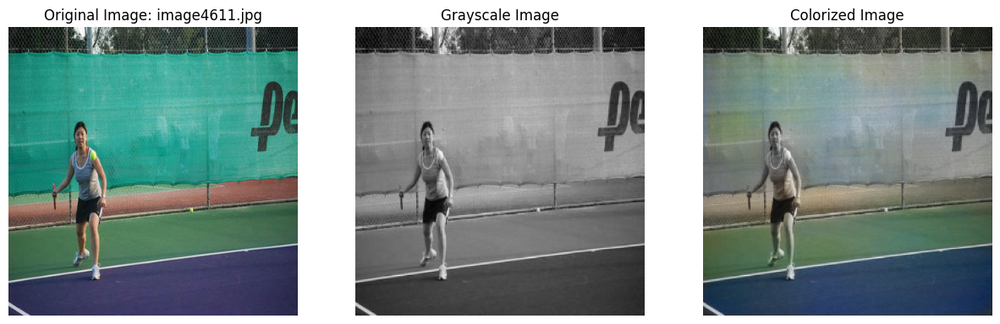

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


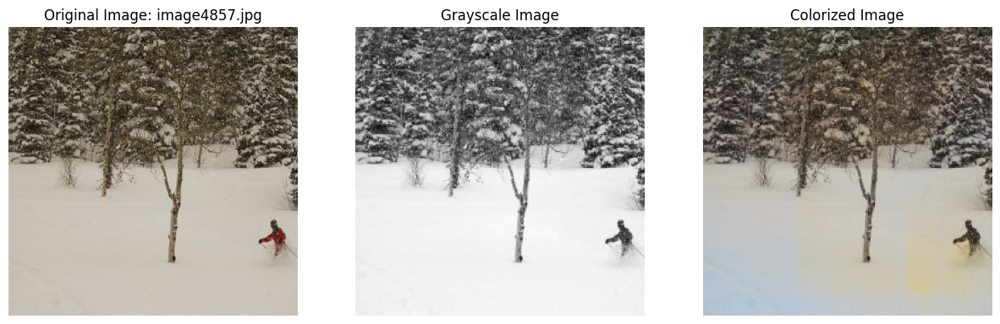

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


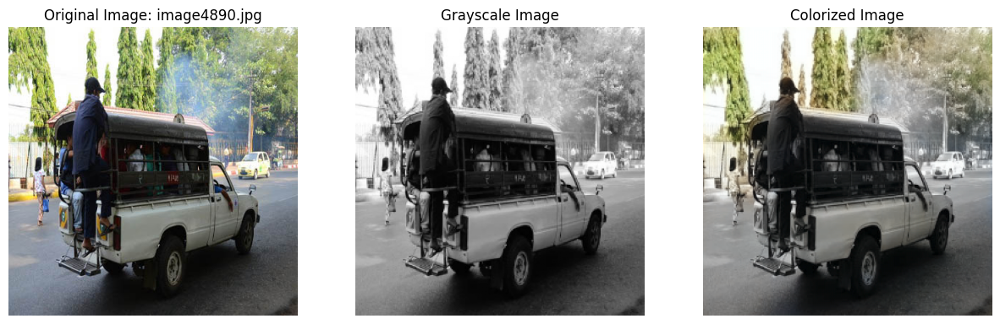

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


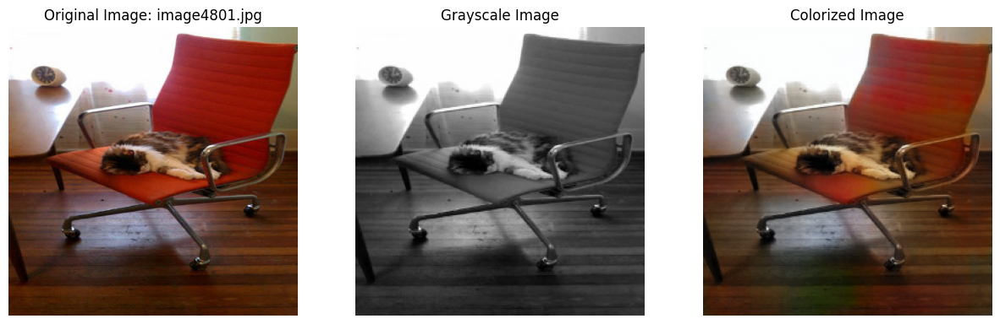

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


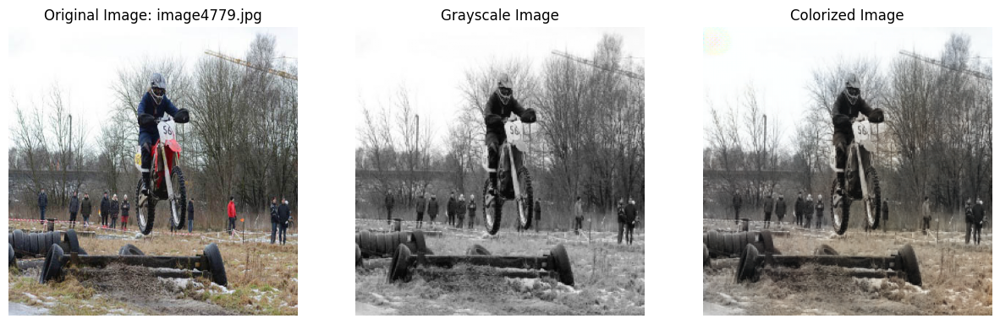

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


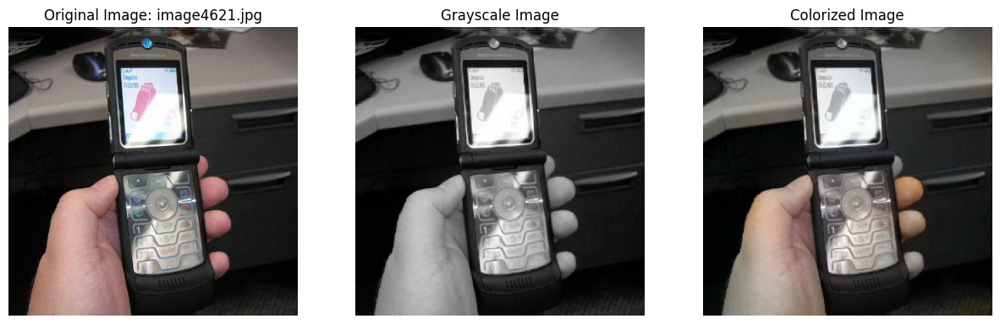

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


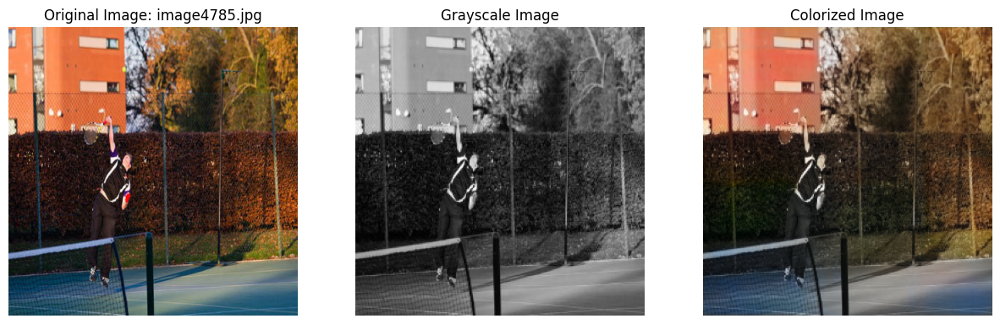

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


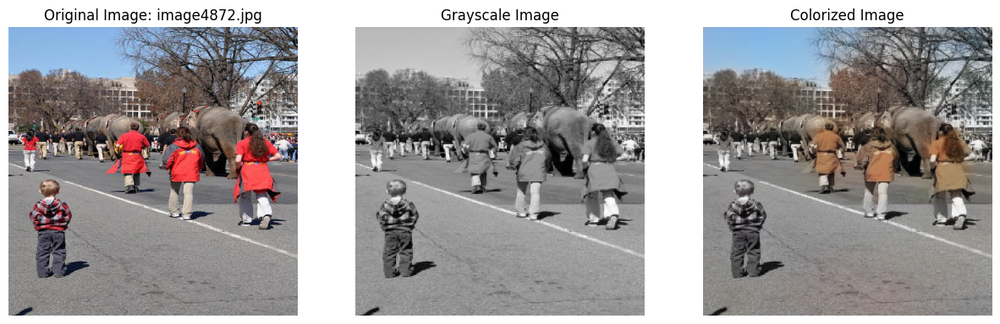

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


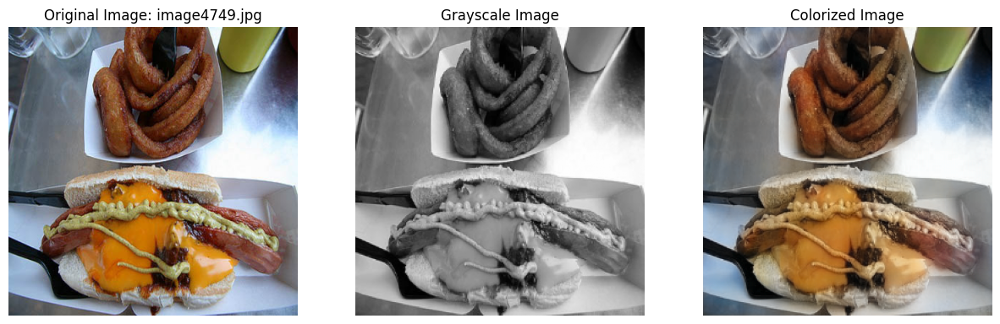

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


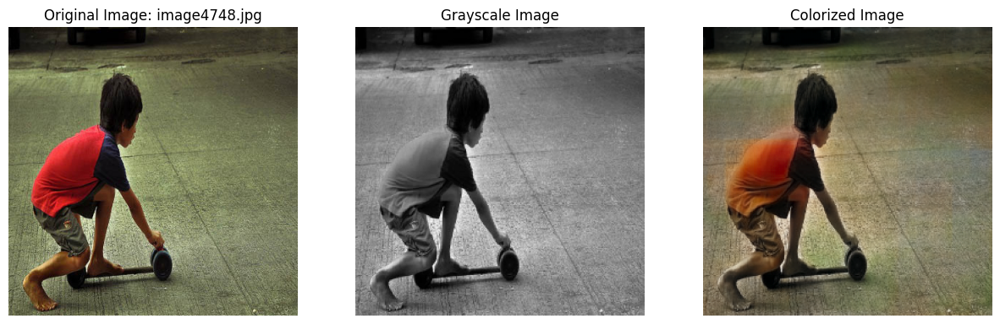

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


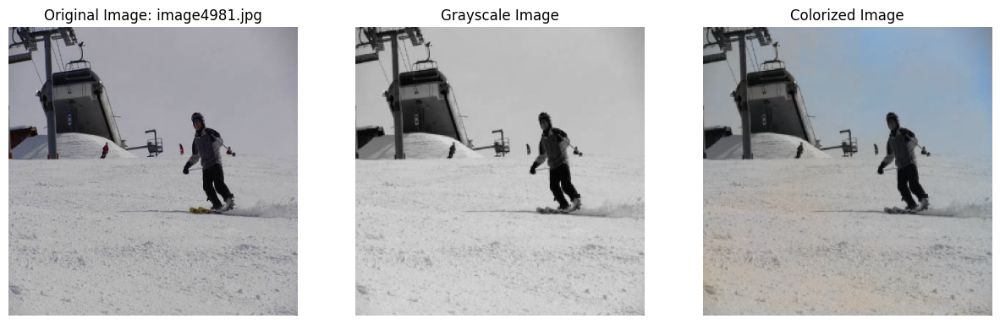

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


KeyboardInterrupt: 

In [9]:
from tensorflow.keras.models import load_model  # type: ignore
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img # type: ignore



model = load_model("u_net_50_epoch_iter_5.h5", compile=False)


image_path = "drive/MyDrive/combined/human0.png"

directory_path = "drive/MyDrive/combined"

# Iterate through all images in the directory
for filename in os.listdir(directory_path):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        image_path = os.path.join(directory_path, filename)

        # Load and preprocess the image
        original_image = load_img(image_path)
        original_image = img_to_array(original_image) / 255.0  # Normalize the original image to [0, 1]
        l_channel, ab_channels = preprocess_image(image_path)

        # Predict the AB channels using the model
        l_channel_input = np.expand_dims(l_channel, axis=0)  # Add batch dimension
        predicted_ab_channels = model.predict(l_channel_input)[0]  # Remove batch dimension

        # Postprocess the predicted LAB image to RGB
        colorized_image = lab_to_rgb(l_channel, predicted_ab_channels)
        grayscale_image = l_channel[:, :, 0]  # Scale back to [0, 100] for visualization

        # Display the original, grayscale, and colorized images
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title(f"Original Image: {filename}")
        plt.imshow(original_image)
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Grayscale Image")
        plt.imshow(grayscale_image, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.title("Colorized Image")
        plt.imshow(colorized_image)
        plt.axis("off")

        plt.show()
